## Implementing text matching and zero shot classification using CLIP, considering MS-COCO as support set

In [ ]:
import os
import json
import random
import csv
import numpy as np
import torch
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from transformers import CLIPProcessor, CLIPModel
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    jaccard_score,
    multilabel_confusion_matrix,
    classification_report
)
from sklearn.metrics.pairwise import cosine_similarity

2025-09-26 10:15:03.106105: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-26 10:15:04.186786: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758861904.522370    7065 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758861904.621506    7065 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1758861905.690006    7065 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

### Task 1: Caption to Image- without train test sets

#### Caption → Image retrieval (find the closest image(s) for a caption), and show that image along with its ground-truth COCO categories.

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device
#model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
#processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32", use_fast=True)


'cuda'

In [ ]:
#model.save_pretrained("./clip_model")
#processor.save_pretrained("./clip_processor")

#using saved model
model = CLIPModel.from_pretrained("./clip_model").to(device)
processor = CLIPProcessor.from_pretrained("./clip_processor")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [ ]:

img_dir = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/val2017'
ann_file_caps = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/captions_val2017.json'
ann_file_cats = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/instances_val2017.json'

with open(ann_file_caps, 'r') as f:
    caps_json = json.load(f)
with open(ann_file_cats, 'r') as f:
    cats_json = json.load(f)


# Build mappings
# Mapping: image_id -> set of category_ids
imgid_to_catids = {}
for ann in cats_json['annotations']:
    imgid_to_catids.setdefault(ann['image_id'], set()).add(ann['category_id'])

# Mapping: category_id -> category_name
catid_to_name = {cat['id']: cat['name'] for cat in cats_json['categories']}

# List of all captions
all_captions = [ann['caption'] for ann in caps_json['annotations']]

# List of all image ids
all_img_ids = [img['id'] for img in cats_json['images']]


# Encode captions in batches
caption_batch_size = 256
all_caption_embeddings = []

print("Encoding captions in batches...")
for i in tqdm(range(0, len(all_captions), caption_batch_size)):
    batch_captions = all_captions[i:i+caption_batch_size]
    inputs = processor(text=batch_captions, return_tensors="pt", padding=True, truncation=True)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        features = model.get_text_features(**inputs)
        features = features / features.norm(p=2, dim=-1, keepdim=True)
    all_caption_embeddings.append(features.cpu())

caption_features = torch.cat(all_caption_embeddings, dim=0).to(device)
print("Caption encoding completed.")

# Encode images in batches
batch_size = 32
all_image_embeddings = []
image_id_list = []

print("Encoding images in batches...")
for start in tqdm(range(0, len(all_img_ids), batch_size)):
    batch_ids = all_img_ids[start:start+batch_size]
    batch_imgs = []
    for img_id in batch_ids:
        img_info = next(img for img in cats_json["images"] if img["id"] == img_id)
        img_path = os.path.join(img_dir, img_info["file_name"])
        image = Image.open(img_path).convert("RGB")
        batch_imgs.append(image)
        image_id_list.append(img_id)

    inputs = processor(images=batch_imgs, return_tensors="pt").to(device)
    with torch.no_grad():
        features = model.get_image_features(**inputs)
        features = features / features.norm(p=2, dim=-1, keepdim=True)
    all_image_embeddings.append(features.cpu())

all_image_embeddings = torch.cat(all_image_embeddings, dim=0).to(device)
print(f"Image embeddings shape: {all_image_embeddings.shape}")


# Function to compute similarity and top-k image retrieval
def get_topk_image_ids(caption_emb, image_embeddings, image_ids, top_k=2, chunk_size=512):
    sims = []
    for start in range(0, image_embeddings.shape[0], chunk_size):
        end = start + chunk_size
        sims.append(caption_emb @ image_embeddings[start:end].T)
    sims = torch.cat(sims, dim=1).squeeze(0)
    topk_idx = sims.topk(top_k).indices.cpu().numpy()
    topk_image_ids = [image_ids[i] for i in topk_idx]
    topk_values = sims[topk_idx].cpu().numpy()
    return topk_image_ids, topk_values

# Metrics helpers
def at_least_k_accuracy(y_true, y_pred, k=1):
    correct = 0
    for true, pred in zip(y_true, y_pred):
        if len(set(true).intersection(set(pred))) >= k:
            correct += 1
    return correct / len(y_true)


Encoding captions in batches...


100%|███████████████████████████████████████████| 98/98 [00:05<00:00, 18.14it/s]


Caption encoding completed.
Encoding images in batches...


100%|█████████████████████████████████████████| 157/157 [01:37<00:00,  1.60it/s]

Image embeddings shape: torch.Size([5000, 512])


Running caption -> image -> category retrieval...


  0%|                                                    | 0/50 [00:00<?, ?it/s]

Caption: A black Honda motorcycle parked in front of a garage.
Ground Truth Categories: ['motorcycle']
Top-k Retrieved Images with Predicted Categories:


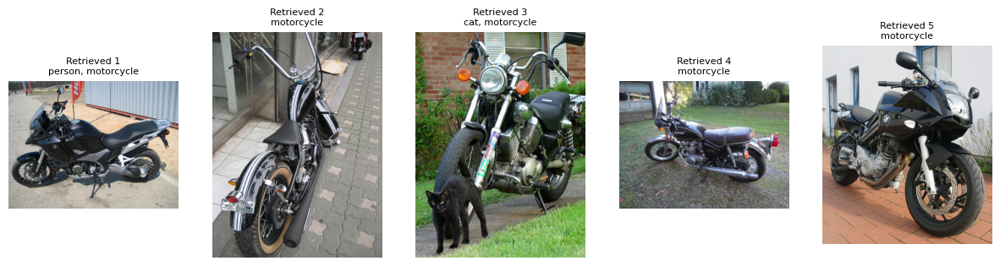

  2%|▉                                           | 1/50 [00:00<00:09,  5.44it/s]

Similarity Scores: [0.31427324 0.31233028 0.30968055 0.30610457 0.29402322]
Caption: A Honda motorcycle parked in a grass driveway
Ground Truth Categories: ['motorcycle']
Top-k Retrieved Images with Predicted Categories:


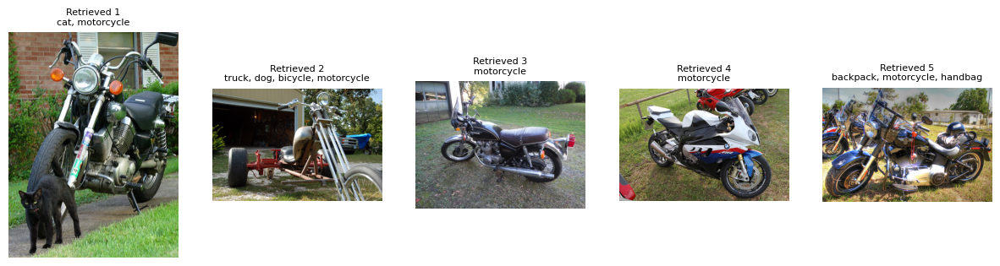

  4%|█▊                                          | 2/50 [00:00<00:07,  6.31it/s]

Similarity Scores: [0.30178195 0.29454395 0.2927416  0.2871923  0.28568807]
Caption: An office cubicle with four different types of computers.
Ground Truth Categories: ['potted plant', 'sports ball', 'tv', 'laptop', 'mouse', 'keyboard', 'bottle', 'cup', 'book', 'vase', 'backpack', 'chair']
Top-k Retrieved Images with Predicted Categories:


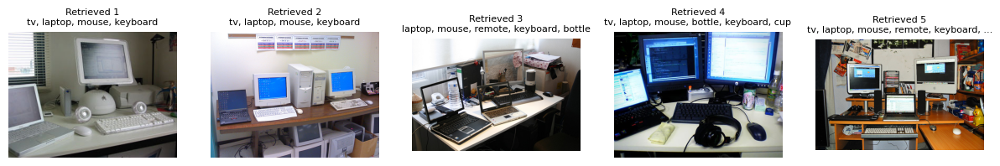

  6%|██▋                                         | 3/50 [00:00<00:06,  6.84it/s]

Similarity Scores: [0.33795443 0.33081412 0.31521848 0.31422868 0.30751094]
Caption: A small closed toilet in a cramped space.
Ground Truth Categories: ['sink', 'toilet']
Top-k Retrieved Images with Predicted Categories:


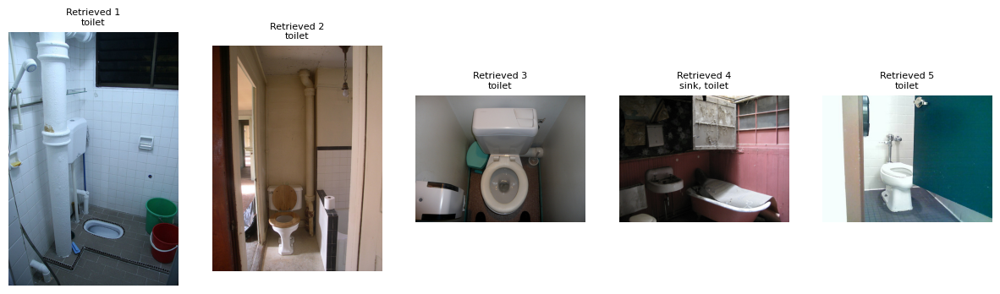

  8%|███▌                                        | 4/50 [00:00<00:07,  6.54it/s]

Similarity Scores: [0.35028723 0.3463651  0.34291118 0.3412012  0.3375726 ]
Caption: Two women waiting at a bench next to a street.
Ground Truth Categories: ['person', 'car', 'truck', 'bench', 'handbag']
Top-k Retrieved Images with Predicted Categories:


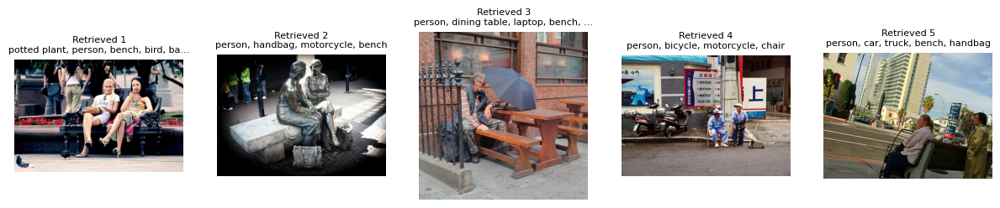

100%|███████████████████████████████████████████| 50/50 [00:00<00:00, 64.22it/s]

Similarity Scores: [0.31774613 0.31421965 0.3140049  0.30479798 0.30260935]

=== Multi-label Metrics ===
At-least-1 Accuracy: 1.0
At-least-2 Accuracy: 0.82
At-least-2 Accuracy: 0.62
At-least-2 Accuracy: 0.4
At-least-2 Accuracy: 0.4
Jaccard (micro): 0.45260663507109006
Precision (micro): 0.4872448979591837
Recall (micro): 0.8642533936651584
F1 (micro): 0.6231647634584013

Classification Report:
              precision    recall  f1-score   support

dining table       0.45      0.90      0.60        10
       mouse       1.00      1.00      1.00         7
        cake       1.00      1.00      1.00         3
         cat       0.50      1.00      0.67         7
      laptop       0.33      1.00      0.50         5
   microwave       0.80      1.00      0.89         4
 sports ball       0.00      0.00      0.00         5
       couch       0.33      1.00      0.50         4
      bottle       0.65      0.93      0.76        14
       chair       0.43      0.90      0.58        10
        


/home/BTECH_7TH_SEM/.local/lib/python3.12/site-packages/sklearn/preprocessing/_label.py:909: UserWarning: unknown class(es) ['apple', 'bicycle', 'bus', 'carrot', 'fire hydrant', 'fork', 'knife', 'orange', 'refrigerator', 'scissors', 'stop sign', 'suitcase', 'teddy bear', 'tie', 'toaster', 'traffic light', 'train', 'umbrella', 'wine glass'] will be ignored
  warnings.warn(


In [ ]:
# Inference loop: Caption -> Image -> Category
top_k = 5
y_true, y_pred = [], []

num_samples = 50  # small number for testing
print("Running caption -> image -> category retrieval...")
for idx in tqdm(range(num_samples)):
    caption = all_captions[idx]
    cap_emb = caption_features[idx].unsqueeze(0).to(device)

    # Retrieve top-k image ids
    top_image_ids, sim_values = get_topk_image_ids(cap_emb, all_image_embeddings, image_id_list, top_k=top_k)

    # Union of categories from top-k images
    pred_cats = set()
    for pid in top_image_ids:
        pred_cats.update(imgid_to_catids.get(pid, []))
    pred_cats_names = [catid_to_name[cid] for cid in pred_cats]

    # Ground truth categories from caption's actual image
    img_id_gt = caps_json["annotations"][idx]["image_id"]
    true_cats = [catid_to_name[cid] for cid in imgid_to_catids.get(img_id_gt, [])]

    y_true.append(true_cats)
    y_pred.append(pred_cats_names)

    # Display first 5 samples
    if idx < 5:
        # Show the ground truth image separately
        gt_info = next(img for img in cats_json["images"] if img["id"] == img_id_gt)
        gt_path = os.path.join(img_dir, gt_info["file_name"])
        gt_image = Image.open(gt_path).convert("RGB")

        print("Caption:", caption)
        print("Ground Truth Categories:", true_cats)
        print("Top-k Retrieved Images with Predicted Categories:")

        plt.figure(figsize=(15, 4))  # wide row layout

        # Plot each retrieved image in a single row
        for j, pid in enumerate(top_image_ids):
            img_info = next(img for img in cats_json["images"] if img["id"] == pid)
            img_path = os.path.join(img_dir, img_info["file_name"])
            image = Image.open(img_path).convert("RGB")
            pred_cats = [catid_to_name[cid] for cid in imgid_to_catids.get(pid, [])]

            # Shorten long lists of categories for display
            pred_cats_str = ", ".join(pred_cats)
            if len(pred_cats_str) > 40:  # truncate if too long
                pred_cats_str = pred_cats_str[:37] + "..."

            plt.subplot(1, top_k, j + 1)
            plt.imshow(image)
            plt.title(f"Retrieved {j+1}\n{pred_cats_str}", fontsize=8)  # smaller font
            plt.axis("off")

        plt.show()
        print("Similarity Scores:", sim_values)
        print("=" * 50)

# Compute multi-label metrics
all_labels = list(set(cat for cats in y_true for cat in cats))
mlb = MultiLabelBinarizer(classes=all_labels)
Y_true = mlb.fit_transform(y_true)
Y_pred = mlb.transform(y_pred)

print("\n=== Multi-label Metrics ===")
print("At-least-1 Accuracy:", at_least_k_accuracy(y_true, y_pred, k=1))
print("At-least-2 Accuracy:", at_least_k_accuracy(y_true, y_pred, k=2))
print("At-least-2 Accuracy:", at_least_k_accuracy(y_true, y_pred, k=3))
print("At-least-2 Accuracy:", at_least_k_accuracy(y_true, y_pred, k=4))
print("At-least-2 Accuracy:", at_least_k_accuracy(y_true, y_pred, k=5))
print("Jaccard (micro):", jaccard_score(Y_true, Y_pred, average="micro"))
print("Precision (micro):", precision_score(Y_true, Y_pred, average="micro"))
print("Recall (micro):", recall_score(Y_true, Y_pred, average="micro"))
print("F1 (micro):", f1_score(Y_true, Y_pred, average="micro"))
print("\nClassification Report:")
print(classification_report(Y_true, Y_pred, target_names=mlb.classes_, zero_division=0))

### Taks 2: Image → caption retrieval

#### Image → caption retrieval (find the closest caption(s) for an image), and show that captions along with its ground-truth COCO categories.

In [ ]:
img_dir = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/val2017'
ann_file_caps = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/captions_val2017.json'
ann_file_cats = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/instances_val2017.json'

with open(ann_file_caps, "r") as f:
    caps_json = json.load(f)
with open(ann_file_cats, "r") as f:
    cats_json = json.load(f)

# Build mappings
imgid_to_captions = {}
for ann in caps_json["annotations"]:
    imgid_to_captions.setdefault(ann["image_id"], []).append(ann["caption"])

catid_to_name = {cat["id"]: cat["name"] for cat in cats_json["categories"]}

imgid_to_catids = {}
for ann in cats_json["annotations"]:
    imgid_to_catids.setdefault(ann["image_id"], set()).add(ann["category_id"])

all_captions = [ann["caption"] for ann in caps_json["annotations"]]
all_img_ids = [img["id"] for img in cats_json["images"]]

print(f"Loaded {len(all_captions)} captions and {len(all_img_ids)} images.")

def get_image_categories(img_id):
    return [catid_to_name[cid] for cid in imgid_to_catids.get(img_id, [])]


# Encode images
batch_size = 64
all_image_embeddings = []
image_id_list = []

print("Encoding images...")
for start in tqdm(range(0, len(all_img_ids), batch_size)):
    end = start + batch_size
    batch_ids = all_img_ids[start:end]
    batch_imgs, batch_paths = [], []
    for img_id in batch_ids:
        img_info = next(img for img in cats_json["images"] if img["id"] == img_id)
        img_path = os.path.join(img_dir, img_info["file_name"])
        image = Image.open(img_path).convert("RGB")
        batch_imgs.append(image)
        batch_paths.append(img_id)
    inputs = processor(images=batch_imgs, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        features = model.get_image_features(**inputs)
        features = features / features.norm(p=2, dim=-1, keepdim=True)
    all_image_embeddings.append(features.cpu())
    image_id_list.extend(batch_ids)

all_image_embeddings = torch.cat(all_image_embeddings, dim=0)  # [num_images, d]
print(f"Image embeddings shape: {all_image_embeddings.shape}")


# Encode captions
caption_embeddings = []
print("Encoding captions...")
for start in tqdm(range(0, len(all_captions), batch_size)):
    end = start + batch_size
    batch_caps = all_captions[start:end]
    inputs = processor(text=batch_caps, return_tensors="pt", padding=True, truncation=True).to(device)
    with torch.no_grad():
        features = model.get_text_features(**inputs)
        features = features / features.norm(p=2, dim=-1, keepdim=True)
    caption_embeddings.append(features.cpu())

caption_embeddings = torch.cat(caption_embeddings, dim=0)  # [num_captions, d]
print(f"Caption embeddings shape: {caption_embeddings.shape}")


Loaded 25014 captions and 5000 images.
Encoding images...


100%|███████████████████████████████████████████| 79/79 [00:22<00:00,  3.45it/s]


Image embeddings shape: torch.Size([5000, 512])
Encoding captions...


100%|████████████████████████████████████████| 391/391 [00:03<00:00, 105.01it/s]

Caption embeddings shape: torch.Size([25014, 512])


Running Image → Caption retrieval...


  0%|                                                  | 0/1000 [00:00<?, ?it/s]


=== SAMPLE 0 ===


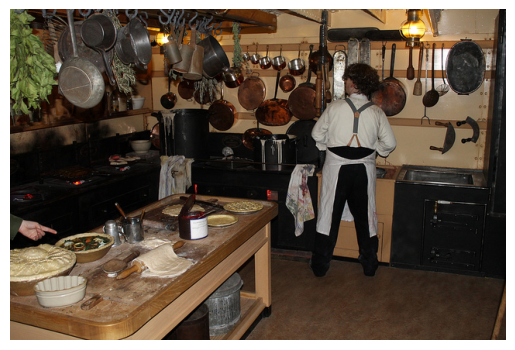

  0%|                                          | 1/1000 [00:00<03:42,  4.50it/s]

Ground Truth Captions:
  - A man is in a kitchen making pizzas.
  - Man in apron standing on front of oven with pans and bakeware
  - A baker is working in the kitchen rolling dough.
  - A person standing by a stove in a kitchen.
  - A table with pies being made and a person standing near a wall with pots and pans hanging on the wall.

Top-k Retrieved Captions (with similarity scores):
  (1) [Score=0.3154] An old fashioned kitchen is set up for display.
  (2) [Score=0.3040] People in a kitchen with cooking attire on
  (3) [Score=0.3005] The cramped interior of a passenger ship's kitchen.
  (4) [Score=0.3001] Two woman soldiers talking to other women in a kitchen
  (5) [Score=0.2995] A kitchen is shown in midst of repairs.

=== SAMPLE 1 ===


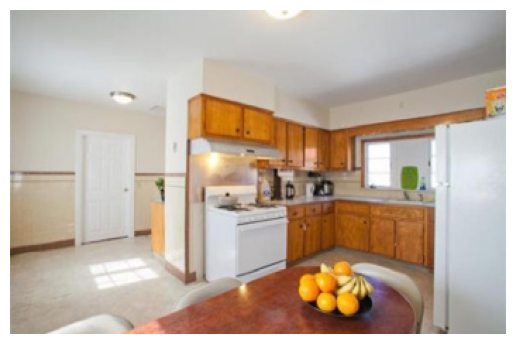

Ground Truth Captions:
  - The dining table near the kitchen has a bowl of fruit on it.
  - A small kitchen has various appliances and a table.
  - The kitchen is clean and ready for us to see.
  - A kitchen and dining area decorated in white.
  - A kitchen that has a bowl of fruit on the table.

Top-k Retrieved Captions (with similarity scores):
  (1) [Score=0.3275] An empty kitchen is photographed as if for a real estate listing.
  (2) [Score=0.3192] A kitchen area features a white refrigerator a stove and other appliances and brown cabinets.
  (3) [Score=0.3190] an orange kitchen with a white refrigerator stove oven and dishwasher
  (4) [Score=0.3157] The kitchen is coral with wooden cabinets and colorful decorations.
  (5) [Score=0.3128] The small kitchen with the spacious counters is clean.

=== SAMPLE 2 ===


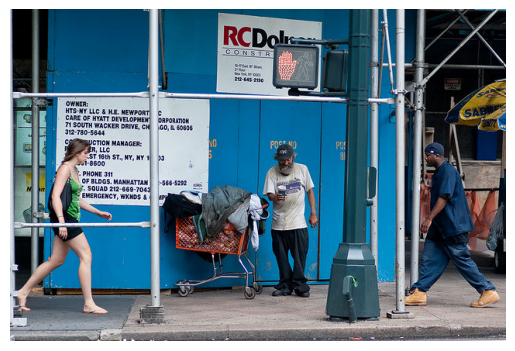

  0%|▏                                         | 3/1000 [00:00<01:44,  9.58it/s]

Ground Truth Captions:
  - a person with a shopping cart on a city street 
  - City dwellers walk by as a homeless man begs for cash.
  - People walking past a homeless man begging on a city street
  - a homeless man holding a cup and standing next to a shopping cart on a street
  - People are walking on the street by a homeless person.

Top-k Retrieved Captions (with similarity scores):
  (1) [Score=0.2976] A man sits on a broken toilet as people walk by. 
  (2) [Score=0.2946] A woman with a cane and shopping bag sitting
  (3) [Score=0.2936] A woman with a beer sits inside a refrigerator on the footpath
  (4) [Score=0.2930] A man in front of a vendor on a skateboard.
  (5) [Score=0.2923] A woman digging through the storage compartment on her moped.

=== SAMPLE 3 ===


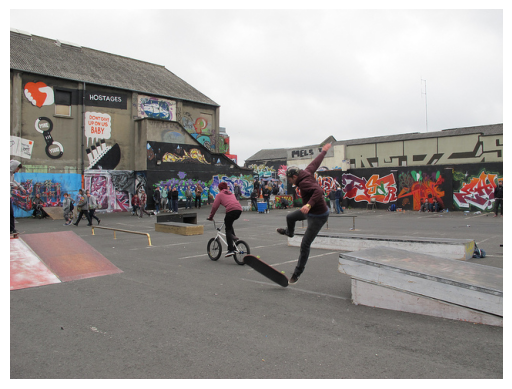

Ground Truth Captions:
  - A person on a skateboard and bike at a skate park.
  - A man on a skateboard performs a trick at the skate park
  - A skateboarder jumps into the air as he performs a skateboard trick.
  - Athletes performing tricks on a BMX bicycle and a skateboard.
  - a man falls off his skateboard in a skate park.

Top-k Retrieved Captions (with similarity scores):
  (1) [Score=0.3277] Athletes performing tricks on a BMX bicycle and a skateboard.
  (2) [Score=0.3138] Skate boarder doing stunts in front of graffiti covered building
  (3) [Score=0.3042] A skateboarder doing a trick at a competition.
  (4) [Score=0.3039] A male skateboarder is trying to pull off a trick on the ramp. 
  (5) [Score=0.3034] A man on a skateboard on a ramp in front of spectators.  

=== SAMPLE 4 ===


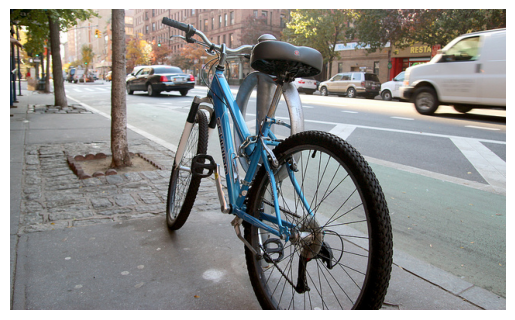

  0%|▏                                         | 5/1000 [00:00<01:25, 11.57it/s]

Ground Truth Captions:
  - a blue bike parked on a side walk 
  - A bicycle is chained to a fixture on a city street
  - A blue bicycle sits on a sidewalk near a street.
  - A bicycle is locked up to a post
  - a bike sits parked next to a street 

Top-k Retrieved Captions (with similarity scores):
  (1) [Score=0.3378] A light blue bicycle chained to a pole on the sidewalk in front of a red building.
  (2) [Score=0.3287] A blue bicycle sits on a sidewalk near a street.
  (3) [Score=0.3135] a blue bike parked on a side walk 
  (4) [Score=0.3025] A blue bicycle with a black basket on the front of it
  (5) [Score=0.2967] A bicycle sits parked along a busy roadside.


100%|██████████████████████████████████████| 1000/1000 [00:07<00:00, 133.53it/s]


In [ ]:
# Image → Caption retrieval

top_k = 5
y_true, y_pred = [], []
retrieved_caps_topk = []
num_samples = 1000  # limit for speed

print("Running Image → Caption retrieval...")
for idx in tqdm(range(num_samples)):
    # Ground-truth image
    img_id = all_img_ids[idx]
    img_emb = all_image_embeddings[idx].unsqueeze(0).to(device)

    # Similarity to all captions (chunked for memory)
    sims = []
    chunk_size = 512
    for start in range(0, len(caption_embeddings), chunk_size):
        end = start + chunk_size
        sim_chunk = img_emb @ caption_embeddings[start:end].T.to(device)
        sims.append(sim_chunk.cpu())
    sims = torch.cat(sims, dim=1).squeeze(0)

    # Top-k captions
    topk = sims.topk(top_k)
    topk_idx = topk.indices.numpy()
    topk_scores = topk.values.numpy()
    pred_caps = [all_captions[i] for i in topk_idx]
    retrieved_caps_topk.append(pred_caps)

    # Ground truth captions for this image
    true_caps = imgid_to_captions.get(img_id, [])
    y_true.append(true_caps)
    y_pred.append(pred_caps)

    # Show a few samples
    if idx < 5:
        print("\n=== SAMPLE", idx, "===")
        # Show the image
        img_info = next(img for img in cats_json["images"] if img["id"] == img_id)
        img_path = os.path.join(img_dir, img_info["file_name"])
        image = Image.open(img_path).convert("RGB")
        plt.imshow(image)
        plt.axis("off")
        plt.show()

        print("Ground Truth Captions:")
        for cap in true_caps:
            print("  -", cap)

        print("\nTop-k Retrieved Captions (with similarity scores):")
        for j, (cap, score) in enumerate(zip(pred_caps, topk_scores), 1):
            print(f"  ({j}) [Score={score:.4f}] {cap}")

In [ ]:
# Metrics (Image → Caption retrieval)
all_captions_set = set(cap for caps in y_true for cap in caps)
all_captions_set.update(cap for caps in y_pred for cap in caps)
all_unique_captions = list(all_captions_set)

mlb = MultiLabelBinarizer(classes=all_unique_captions)
Y_true = mlb.fit_transform(y_true)
Y_pred = mlb.transform(y_pred)

# At-least-k accuracy
def at_least_k_accuracy(true_sets, pred_sets, k=1):
    correct = 0
    for t, p in zip(true_sets, pred_sets):
        if len(set(t) & set(p)) >= k:
            correct += 1
    return correct / len(true_sets)

# Recall@k
def recall_at_k(true_sets, pred_sets, k=1):
    correct = 0
    for gt, preds in zip(true_sets, pred_sets):
        if any(c in preds[:k] for c in gt):
            correct += 1
    return correct / len(true_sets)

print("\n===== METRICS (Image → Caption) =====")
# Multi-label metrics
print("Subset accuracy (exact match):", accuracy_score(Y_true, Y_pred))
print("Micro Precision:", precision_score(Y_true, Y_pred, average="micro", zero_division=0))
print("Micro Recall:", recall_score(Y_true, Y_pred, average="micro", zero_division=0))
print("Micro F1:", f1_score(Y_true, Y_pred, average="micro", zero_division=0))
print("Macro Precision:", precision_score(Y_true, Y_pred, average="macro", zero_division=0))
print("Macro Recall:", recall_score(Y_true, Y_pred, average="macro", zero_division=0))
print("Macro F1:", f1_score(Y_true, Y_pred, average="macro", zero_division=0))

# Retrieval metrics
print("Recall@1:", recall_at_k(y_true, y_pred, k=1))
print("Recall@5:", recall_at_k(y_true, y_pred, k=5))
print("Recall@10:", recall_at_k(y_true, y_pred, k=10))

# At-least-k metrics
print("\nAt least 1 label correct:", at_least_k_accuracy(y_true, y_pred, k=1))
print("At least 2 labels correct:", at_least_k_accuracy(y_true, y_pred, k=2))
print("At least 3 labels correct:", at_least_k_accuracy(y_true, y_pred, k=3))
print("At least 4 labels correct:", at_least_k_accuracy(y_true, y_pred, k=4))
print("At least 5 labels correct:", at_least_k_accuracy(y_true, y_pred, k=5))

# Limit report to first 10 captions (for readability)
top_n = 10
Y_true_subset = Y_true[:, :top_n]
Y_pred_subset = Y_pred[:, :top_n]
target_names_subset = [cap[:50]+"..." if len(cap)>50 else cap for cap in mlb.classes_[:top_n]]

print("\n=== Classification Report (first 10 captions) ===")
print(classification_report(Y_true_subset, Y_pred_subset,
                            target_names=target_names_subset,
                            zero_division=0))



===== METRICS (Image → Caption) =====
Subset accuracy (exact match): 0.037
Micro Precision: 0.3412873471024664
Micro Recall: 0.34012789768185453
Micro F1: 0.34070663597237516
Macro Precision: 0.2172969880531718
Macro Recall: 0.240565371024735
Macro F1: 0.22445746715004664
Recall@1: 0.515
Recall@5: 0.757
Recall@10: 0.757

At least 1 label correct: 0.757
At least 2 labels correct: 0.513
At least 3 labels correct: 0.279
At least 4 labels correct: 0.116
At least 5 labels correct: 0.037

=== Classification Report (first 10 captions) ===
                                                       precision    recall  f1-score   support

          A couple of people at a table in a kitchen.       1.00      1.00      1.00         1
         a painting of fruit and a candle with a vase       1.00      1.00      1.00         1
A vehicle crosses an intersection near a building ...       0.00      0.00      0.00         0
She is cross-country skiing for the exercise it pr...       0.00      0.00      

### Task 3: Test captions -> nearest train image

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

model = CLIPModel.from_pretrained("./clip_model").to(device)
processor = CLIPProcessor.from_pretrained("./clip_processor")

img_dir = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/val2017'
ann_file_caps = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/captions_val2017.json'
ann_file_cats = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/instances_val2017.json'

# Load captions
with open(ann_file_caps, 'r') as f:
    caps_json = json.load(f)

all_captions = [ann['caption'] for ann in caps_json['annotations']]
all_image_ids = [ann['image_id'] for ann in caps_json['annotations']]


# Load categories
with open(ann_file_cats, 'r') as f:
    cats_json = json.load(f)

# Map image_id -> set(category_ids) to avoid duplicates
imgid_to_catids = {}
for ann in cats_json['annotations']:
    imgid_to_catids.setdefault(ann['image_id'], set()).add(ann['category_id'])

# Map category_id -> category_name
catid_to_name = {cat['id']: cat['name'] for cat in cats_json['categories']}

def get_image_categories(img_id):
    cat_ids = imgid_to_catids.get(img_id, set())
    return [catid_to_name[cid] for cid in cat_ids]

# Map image_id -> file_name
imgid_to_filename = {img['id']: img['file_name'] for img in cats_json['images']}

In [ ]:
# Split into train (2000 images) and test (3000 images)
unique_image_ids = list(set(all_image_ids))
random.shuffle(unique_image_ids)

train_img_ids = unique_image_ids[:2000]
test_img_ids = unique_image_ids[2000:5000]

# Create train and test data
train_data = [{'image_id': img_id, 'categories': get_image_categories(img_id)} for img_id in train_img_ids]
test_data = []
for ann in caps_json['annotations']:
    if ann['image_id'] in test_img_ids:
        test_data.append({'caption': ann['caption'], 'image_id': ann['image_id']})

# encode images in batches
def encode_images_batch(img_ids, batch_size=16):
    all_feats = []
    valid_ids_list = []
    for i in tqdm(range(0, len(img_ids), batch_size)):
        batch_ids = img_ids[i:i+batch_size]
        images = []
        valid_ids = []
        for img_id in batch_ids:
            try:
                img_path = os.path.join(img_dir, imgid_to_filename[img_id])
                img = Image.open(img_path).convert("RGB")
                images.append(img)
                valid_ids.append(img_id)
            except:
                continue
        if len(images) == 0:
            continue
        inputs = processor(images=images, return_tensors="pt").to(device)
        with torch.no_grad():
            feats = model.get_image_features(**inputs)
            feats = feats / feats.norm(p=2, dim=-1, keepdim=True)
        all_feats.append(feats.cpu())
        valid_ids_list.extend(valid_ids)
    return torch.cat(all_feats, dim=0), valid_ids_list


# Encode train images
print("Encoding train images...")
train_image_embeddings, valid_train_ids = encode_images_batch(train_img_ids, batch_size=16)
train_labels_list = [get_image_categories(img_id) for img_id in valid_train_ids]


# Encode test captions in batches
def encode_captions_batch(captions, batch_size=256):
    all_feats = []
    for i in tqdm(range(0, len(captions), batch_size)):
        batch_captions = captions[i:i+batch_size]
        inputs = processor(text=batch_captions, return_tensors="pt", padding=True, truncation=True).to(device)
        with torch.no_grad():
            feats = model.get_text_features(**inputs)
            feats = feats / feats.norm(p=2, dim=-1, keepdim=True)
        all_feats.append(feats.cpu())
    return torch.cat(all_feats, dim=0)

print("Encoding test captions...")
test_captions = [d['caption'] for d in test_data]
test_caption_embeddings = encode_captions_batch(test_captions, batch_size=256)


Encoding train images...


100%|█████████████████████████████████████████| 125/125 [00:08<00:00, 14.41it/s]


Encoding test captions...


100%|███████████████████████████████████████████| 59/59 [00:02<00:00, 26.31it/s]


Assigning top-k labels to test captions...


100%|███████████████████████████████████████████| 59/59 [00:01<00:00, 33.07it/s]



Test Caption: An office cubicle with four different types of computers.
Ground-truth Labels of test image: ['potted plant', 'sports ball', 'tv', 'laptop', 'mouse', 'keyboard', 'bottle', 'cup', 'book', 'vase', 'backpack', 'chair']
Predicted Labels (union of top-5 images): ['couch', 'mouse', 'bottle', 'tv', 'chair', 'book', 'cup', 'potted plant', 'laptop', 'keyboard', 'remote']


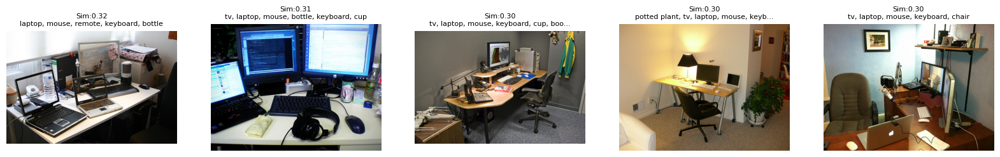


Test Caption: A small closed toilet in a cramped space.
Ground-truth Labels of test image: ['sink', 'toilet']
Predicted Labels (union of top-5 images): ['person', 'sink', 'toilet']


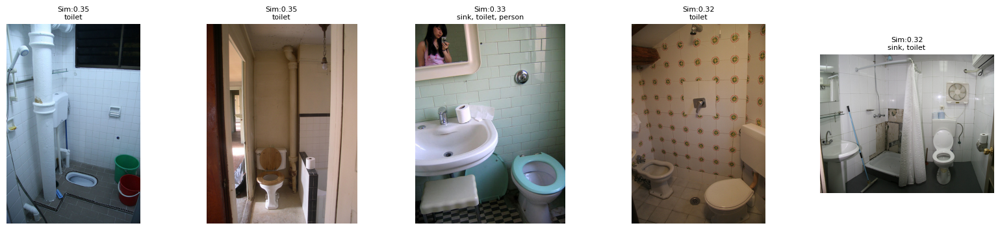


Test Caption: A tan toilet and sink combination in a small room.
Ground-truth Labels of test image: ['sink', 'toilet']
Predicted Labels (union of top-5 images): ['person', 'sink', 'toilet']


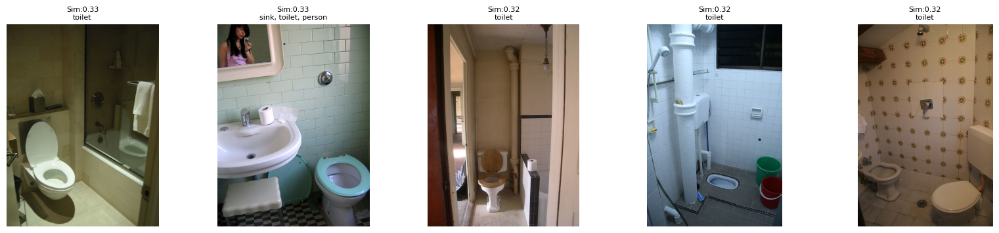


Test Caption: The home office space seems to be very cluttered.
Ground-truth Labels of test image: ['potted plant', 'sports ball', 'tv', 'laptop', 'mouse', 'keyboard', 'bottle', 'cup', 'book', 'vase', 'backpack', 'chair']
Predicted Labels (union of top-5 images): ['mouse', 'bottle', 'tv', 'chair', 'book', 'cup', 'cat', 'laptop', 'keyboard', 'remote', 'cell phone']


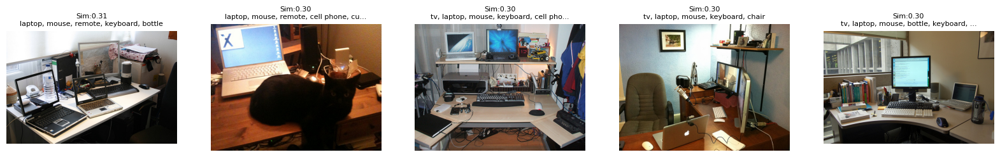


Test Caption: This is an advanced toilet with a sink and control panel.
Ground-truth Labels of test image: ['sink', 'toilet']
Predicted Labels (union of top-5 images): ['person', 'sink', 'book', 'toilet']


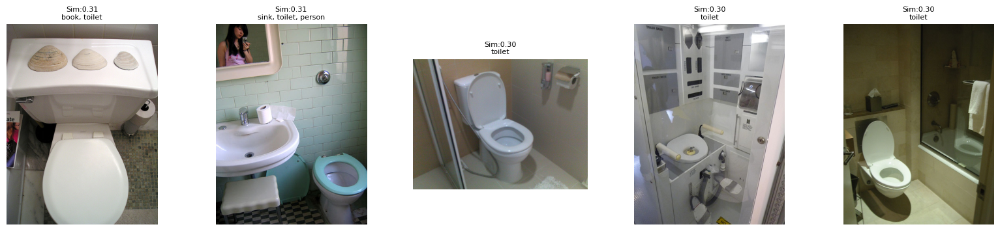

In [ ]:
# Assign top-k labels: test captions -> nearest k train images
top_k = 5
predicted_labels = []
nearest_train_img_ids_topk = []
similarity_values_topk = []

print("Assigning top-k labels to test captions...")
chunk_size = 256
for i in tqdm(range(0, test_caption_embeddings.shape[0], chunk_size)):
    chunk = test_caption_embeddings[i:i+chunk_size].to(device)
    sims = cosine_similarity(chunk.cpu().numpy(), train_image_embeddings.numpy())  # [chunk_size, num_train]

    topk_idx = np.argsort(-sims, axis=1)[:, :top_k]  # indices of top-k
    topk_sims = np.take_along_axis(sims, topk_idx, axis=1)

    for row_idx in range(topk_idx.shape[0]):
        ids = [valid_train_ids[j] for j in topk_idx[row_idx]]
        sims_vals = topk_sims[row_idx]
        labels = [train_labels_list[j] for j in topk_idx[row_idx]]

        # Union of predicted categories from top-k images
        pred_cats = set()
        for l in labels:
            pred_cats.update(l)

        predicted_labels.append(list(pred_cats))
        nearest_train_img_ids_topk.append(ids)
        similarity_values_topk.append(sims_vals)

# Display some test captions and top-k images
num_display = 5
for i in range(num_display):
    caption = test_captions[i]
    labels = predicted_labels[i]
    topk_ids = nearest_train_img_ids_topk[i]
    topk_sims = similarity_values_topk[i]
    test_img_id = test_data[i]['image_id']
    gt_labels = get_image_categories(test_img_id)

    print(f"\nTest Caption: {caption}")
    print(f"Ground-truth Labels of test image: {gt_labels}")
    print(f"Predicted Labels (union of top-{top_k} images): {labels}")

    # Plot top-k images
    plt.figure(figsize=(4*top_k, 4))
    for j, pid in enumerate(topk_ids):
        img_path = os.path.join(img_dir, imgid_to_filename[pid])
        img = Image.open(img_path).convert("RGB")
        pred_cats = [catid_to_name[cid] for cid in imgid_to_catids.get(pid, [])]
        pred_cats_str = ", ".join(pred_cats)
        if len(pred_cats_str) > 40:
            pred_cats_str = pred_cats_str[:37] + "..."

        plt.subplot(1, top_k, j+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Sim:{topk_sims[j]:.2f}\n{pred_cats_str}", fontsize=8)
    plt.show()
    print("="*80)



In [ ]:
# Compute multi-label metrics

all_labels = list(set(cat for cats in predicted_labels+ [get_image_categories(d['image_id']) for d in test_data] for cat in cats))
mlb = MultiLabelBinarizer(classes=all_labels)
Y_true = mlb.fit_transform([get_image_categories(d['image_id']) for d in test_data])
Y_pred = mlb.transform(predicted_labels)

# At-least-k accuracy
def at_least_k_accuracy(true_sets, pred_sets, k=1):
    correct = 0
    for t, p in zip(true_sets, pred_sets):
        if len(set(t) & set(p)) >= k:
            correct += 1
    return correct / len(true_sets)

print("\n===== Multi-label Metrics (Top-k Retrieval) =====")
print("At-least-1 Accuracy:", at_least_k_accuracy(Y_true, Y_pred, k=1))
print("At-least-2 Accuracy:", at_least_k_accuracy(Y_true, Y_pred, k=2))
print("At-least-3 Accuracy:", at_least_k_accuracy(Y_true, Y_pred, k=3))
print("At-least-4 Accuracy:", at_least_k_accuracy(Y_true, Y_pred, k=4))
print("At-least-5 Accuracy:", at_least_k_accuracy(Y_true, Y_pred, k=5))
print("Jaccard (micro):", jaccard_score(Y_true, Y_pred, average="micro"))
print("Precision (micro):", precision_score(Y_true, Y_pred, average="micro"))
print("Recall (micro):", recall_score(Y_true, Y_pred, average="micro"))
print("F1 (micro):", f1_score(Y_true, Y_pred, average="micro"))

print("\n=== Classification Report (first 10 categories) ===")
top10_classes = all_labels[:10]
top10_idx = [all_labels.index(c) for c in top10_classes]
Y_true_top10 = Y_true[:, top10_idx]
Y_pred_top10 = Y_pred[:, top10_idx]

print(classification_report(Y_true_top10, Y_pred_top10,
                            target_names=[catid_to_name[c] if c in catid_to_name else str(c) for c in top10_classes],
                            zero_division=0))


===== Multi-label Metrics (Top-k Retrieval) =====
At-least-1 Accuracy: 1.0
At-least-2 Accuracy: 0.9898740923322896
At-least-3 Accuracy: 0.0
At-least-4 Accuracy: 0.0
At-least-5 Accuracy: 0.0
Jaccard (micro): 0.2895954139201401
Precision (micro): 0.3125300861131416
Recall (micro): 0.7978290057574585
F1 (micro): 0.4491259984242991

=== Classification Report (first 10 categories) ===
               precision    recall  f1-score   support

 dining table       0.35      0.81      0.49      1516
        mouse       0.33      0.88      0.48       290
  sports ball       0.42      0.83      0.56       500
parking meter       0.22      0.48      0.30       110
       orange       0.24      0.56      0.33       255
tennis racket       0.75      0.96      0.84       440
         bird       0.22      0.73      0.33       371
        train       0.48      0.93      0.63       457
          bed       0.42      0.77      0.54       460
     scissors       0.27      0.48      0.35       100

    micro

### Task 4: Test image -> nearest train caption

In [ ]:
img_dir = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/val2017'
ann_caps = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/captions_val2017.json'
ann_cats = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/instances_val2017.json'
model_dir, proc_dir = './clip_model', './clip_processor'

device = "cuda" if torch.cuda.is_available() else "cpu"
train_count, test_count = 2000, 3000
cap_bs, img_bs, top_k_captions, num_display = 256, 16, 5, 6  # top_k_captions = 5 for top-5 evaluation

model = CLIPModel.from_pretrained(model_dir).to(device).eval()
processor = CLIPProcessor.from_pretrained(proc_dir)

with open(ann_caps) as f: caps_json = json.load(f)
with open(ann_cats) as f: cats_json = json.load(f)

imgid_to_catids = {}
for ann in cats_json['annotations']:
    imgid_to_catids.setdefault(ann['image_id'], set()).add(ann['category_id'])

catid_to_name = {c['id']: c['name'] for c in cats_json['categories']}
all_cats = list(catid_to_name.values())
catname_to_idx = {n: i for i, n in enumerate(all_cats)}
imgid_to_fname = {img['id']: img['file_name'] for img in cats_json['images']}

get_labels = lambda img_id: [catid_to_name[c] for c in imgid_to_catids.get(img_id, set())]


# Train/Test Split
unique_ids = list({a['image_id'] for a in caps_json['annotations']})
random.shuffle(unique_ids)
train_ids, test_ids = unique_ids[:train_count], unique_ids[train_count:train_count+test_count]

train_captions = [{'caption': a['caption'], 'labels': get_labels(a['image_id'])}
                  for a in caps_json['annotations'] if a['image_id'] in train_ids]
test_images = [{'image_id': tid, 'labels': get_labels(tid)} for tid in test_ids]


# Encoding
def encode_texts(texts, bs=cap_bs):
    embs = []
    for i in tqdm(range(0, len(texts), bs), desc="Encoding captions"):
        inp = processor(text=texts[i:i+bs], return_tensors="pt", padding=True, truncation=True).to(device)
        with torch.no_grad():
            f = model.get_text_features(**inp)
            f = f / f.norm(p=2, dim=-1, keepdim=True)
        embs.append(f.cpu())
    return torch.cat(embs)

def encode_imgs(img_ids, bs=img_bs):
    embs, valid_ids = [], []
    for i in tqdm(range(0, len(img_ids), bs), desc="Encoding images"):
        imgs, ids = [], []
        for iid in img_ids[i:i+bs]:
            try: imgs.append(Image.open(os.path.join(img_dir, imgid_to_fname[iid])).convert("RGB")); ids.append(iid)
            except: continue
        if not imgs: continue
        inp = processor(images=imgs, return_tensors="pt").to(device)
        inp = {k:(v.half() if v.dtype.is_floating_point else v) for k,v in inp.items()}
        with torch.no_grad():
            f = model.get_image_features(**inp)
            f = f / f.norm(p=2, dim=-1, keepdim=True)
        embs.append(f.cpu())
        valid_ids.extend(ids)
    return torch.cat(embs), valid_ids

train_embs = encode_texts([c['caption'] for c in train_captions])
test_embs, valid_ids = encode_imgs([d['image_id'] for d in test_images])

# Multi-hot ground truth
y_true = np.array([[1 if n in get_labels(iid) else 0 for n in all_cats] for iid in valid_ids])


Encoding images: 100%|████████████████████████| 188/188 [00:12<00:00, 14.47it/s]


In [ ]:
# Prediction + Top-k storage
pred_labels, pred_multi_hot = [], []

train_embs_np, test_embs_np = train_embs.numpy(), test_embs.numpy()

for i in tqdm(range(len(test_embs_np)), desc="Matching test images"):
    sims = cosine_similarity(test_embs_np[i:i+1], train_embs_np)[0]
    top_idx = sims.argsort()[-top_k_captions:][::-1]  # top-k indices
    # union of labels
    labs = {l for idx in top_idx for l in train_captions[idx]['labels']}
    pred_labels.append(list(labs))
    # multi-hot
    hot = np.zeros(len(all_cats), int)
    [hot.__setitem__(catname_to_idx[l],1) for l in labs if l in catname_to_idx]
    pred_multi_hot.append(hot)

pred_multi_hot = np.array(pred_multi_hot)

Matching test images: 100%|████████████████| 3000/3000 [00:22<00:00, 131.04it/s]


In [ ]:
# Use correct multi-hot arrays
Y_true = y_true
Y_pred = pred_multi_hot

# At-least-k accuracy
def at_least_k_accuracy(Y_true, Y_pred, k=1):
    correct = 0
    for t, p in zip(Y_true, Y_pred):
        if np.sum(np.logical_and(t, p)) >= k:
            correct += 1
    return correct / len(Y_true)

print("\n===== Multi-label Metrics (Top-5 Retrieval) =====")
print("Micro Precision:", precision_score(Y_true, Y_pred, average='micro', zero_division=0))
print("Micro Recall:   ", recall_score(Y_true, Y_pred, average='micro', zero_division=0))
print("Micro F1:       ", f1_score(Y_true, Y_pred, average='micro', zero_division=0))
print("Jaccard (micro):", jaccard_score(Y_true, Y_pred, average="micro"))
print("At least 1 label correct:", at_least_k_accuracy(Y_true, Y_pred, k=1))
print("At least 2 labels correct:", at_least_k_accuracy(Y_true, Y_pred, k=2))
print("At least 3 labels correct:", at_least_k_accuracy(Y_true, Y_pred, k=3))
print("At least 4 labels correct:", at_least_k_accuracy(Y_true, Y_pred, k=4))
print("At least 5 labels correct:", at_least_k_accuracy(Y_true, Y_pred, k=5))

# Classification report for first 10 categories
first_10_cats = all_cats[:10]
indices = [all_cats.index(c) for c in first_10_cats]
Y_true_10 = Y_true[:, indices]
Y_pred_10 = Y_pred[:, indices]

print("\n=== Classification Report (First 10 Categories) ===")
print(classification_report(Y_true_10, Y_pred_10,
                            target_names=first_10_cats,
                            zero_division=0))

# Confusion Matrix (multi-label)
ml_cm = multilabel_confusion_matrix(y_true, pred_multi_hot)
print(f"Multi-label confusion matrix shape: {ml_cm.shape}")
ml_cm



===== Multi-label Metrics (Top-5 Retrieval) =====
Micro Precision: 0.3499323681178298
Micro Recall:    0.7879300620417372
Micro F1:        0.484631929508083
Jaccard (micro): 0.31981136394853715
At least 1 label correct: 0.979
At least 2 labels correct: 0.7056666666666667
At least 3 labels correct: 0.335
At least 4 labels correct: 0.15966666666666668
At least 5 labels correct: 0.077

=== Classification Report (First 10 Categories) ===
               precision    recall  f1-score   support

       person       0.68      0.97      0.80      1631
      bicycle       0.20      0.56      0.30        94
          car       0.29      0.68      0.41       332
   motorcycle       0.38      0.76      0.51        99
     airplane       0.77      0.95      0.85        61
          bus       0.49      0.79      0.61       125
        train       0.58      0.94      0.71        93
        truck       0.22      0.59      0.32       148
         boat       0.44      0.77      0.56        71
traffic li

array([[[ 628,  741],
        [  45, 1586]],

       [[2697,  209],
        [  41,   53]],

       [[2122,  546],
        [ 105,  227]],

       [[2779,  122],
        [  24,   75]],

       [[2922,   17],
        [   3,   58]],

       [[2773,  102],
        [  26,   99]],

       [[2843,   64],
        [   6,   87]],

       [[2545,  307],
        [  61,   87]],

       [[2860,   69],
        [  16,   55]],

       [[2673,  211],
        [  43,   73]],

       [[2877,   67],
        [  20,   36]],

       [[2861,  100],
        [  13,   26]],

       [[2940,   33],
        [  14,   13]],

       [[2520,  345],
        [  58,   77]],

       [[2799,  124],
        [  21,   56]],

       [[2862,   32],
        [  18,   88]],

       [[2816,   84],
        [  21,   79]],

       [[2866,   61],
        [   8,   65]],

       [[2936,   34],
        [   4,   26]],

       [[2891,   56],
        [   8,   45]],

       [[2930,   19],
        [   2,   49]],

       [[2966,    8],
        [   


Image 277584 | GT: ['cat', 'bench'] | Pred: ['potted plant', 'cat']
  sim=0.3273 | ['potted plant', 'cat'] | a black and white cat sitting by a window and looking outside
  sim=0.3222 | ['cat'] | A cat sitting on a window sill behind mini blinds.
  sim=0.3221 | ['potted plant', 'cat'] | A cat sitting in behind a window looking out.
  sim=0.3215 | ['cat'] | A cat sits in the window behind the blind and looks outside.
  sim=0.3201 | ['cat'] | a cat that is sitting outside a door


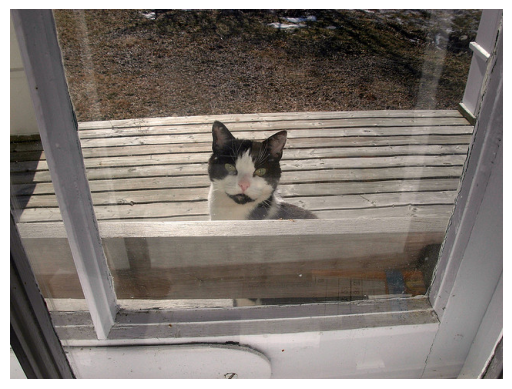


Image 460683 | GT: ['tie', 'person', 'dining table', 'chair'] | Pred: ['person', 'chair', 'tie']
  sim=0.2953 | ['tie', 'person'] | A decorated neck tie saying "Reel Big Fish"
  sim=0.2668 | ['tie', 'person', 'chair'] | Not really a good choice for this shirt and tie combination.
  sim=0.2644 | ['tie', 'person'] | A man's striped dress shirt and patterned tie.
  sim=0.2642 | ['tie', 'person', 'chair'] | A man wearing a collar shirt with a blue tie
  sim=0.2611 | ['tie', 'person'] | The man is waring a colorful tie and a dark jacket.


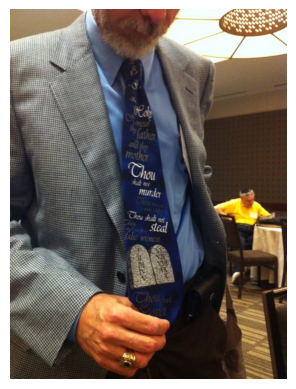


Image 426268 | GT: ['person', 'car', 'train'] | Pred: ['person', 'train', 'traffic light']
  sim=0.2925 | ['person', 'train'] | An old fashioned looking red train is on the tracks by a green grassy hill.
  sim=0.2922 | ['person', 'train'] | An old- fashioned train rounds the corner on train tracks. 
  sim=0.2921 | ['person', 'train'] | An old fashioned train engine caked up to a caboose.
  sim=0.2901 | ['person', 'traffic light', 'train'] | An old fashioned train riding on train tracks in a wooded area.
  sim=0.2866 | ['person', 'traffic light', 'train'] | An old fashioned steam engine train traveling down railroad tracks.


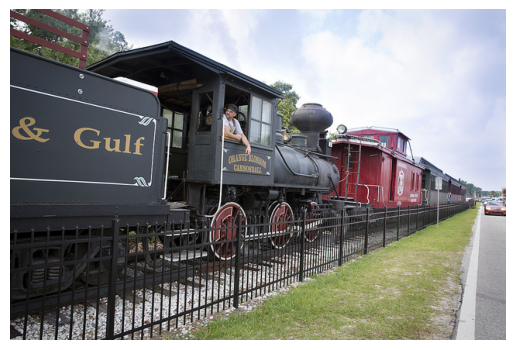


Image 183500 | GT: ['person', 'airplane'] | Pred: ['person', 'airplane']
  sim=0.3032 | ['person', 'airplane'] | A small red and white plane flying in the sky.
  sim=0.2917 | ['person', 'airplane'] | a man flying a small plane in the  clear weather 
  sim=0.2892 | ['airplane'] | An old photo of a small plane in the air.
  sim=0.2887 | ['airplane'] | An aircraft is flying in a cloudy sky. 
  sim=0.2841 | ['airplane'] | A large aircraft is shown in the air.


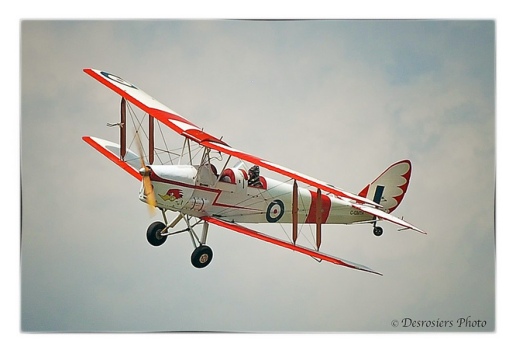


Image 190756 | GT: ['person', 'motorcycle'] | Pred: ['person', 'skateboard', 'backpack', 'skis', 'car', 'motorcycle']
  sim=0.2826 | ['person', 'motorcycle'] | A man is nearly sideways while racing a motorcycle around a track.
  sim=0.2813 | ['person', 'motorcycle'] | A man riding no a motorcycle down a race tracks.
  sim=0.2745 | ['person', 'backpack', 'motorcycle'] | Two people stand near a bike wearing helmets.
  sim=0.2679 | ['person', 'skis'] | A skier performing a backflip with the sky as background
  sim=0.2675 | ['person', 'car', 'skateboard'] | A skateboard enthusiast performing a stunt in mid air.


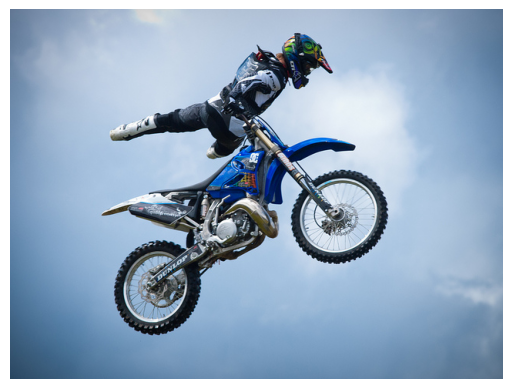


Image 49091 | GT: [] | Pred: ['toilet', 'person', 'bottle', 'stop sign', 'traffic light']
  sim=0.3021 | ['person', 'toilet'] | A virtual mirage of people on a wall reaching up.
  sim=0.2818 | [] | a close up of street signs with buildings in the background
  sim=0.2799 | ['person', 'traffic light', 'bottle'] | A large mural on a building at an intersection.
  sim=0.2798 | ['traffic light', 'stop sign'] | A distorted image shows street signs and a desert. 
  sim=0.2738 | ['person'] | Number of street signs in front of a big building.


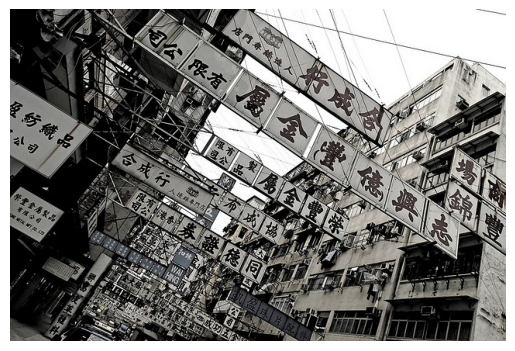


Saved results to flipped_zero_shot_topk_results.csv


In [ ]:
# Display sample test images
for i in range(min(num_display, len(valid_ids))):
    iid, gt, pred = valid_ids[i], get_labels(valid_ids[i]), pred_labels[i]
    sims = cosine_similarity(test_embs_np[i:i+1], train_embs_np)[0]
    top_idx = sims.argsort()[-top_k_captions:][::-1]
    print(f"\nImage {iid} | GT: {gt} | Pred: {pred}")
    for idx in top_idx:
        print(f"  sim={sims[idx]:.4f} | {train_captions[idx]['labels']} | {train_captions[idx]['caption']}")
    plt.imshow(Image.open(os.path.join(img_dir, imgid_to_fname[iid]))); plt.axis("off"); plt.show()

# Save Results
with open("flipped_zero_shot_topk_results.csv","w",newline='',encoding="utf-8") as f:
    w=csv.writer(f); w.writerow(["id","gt","pred"])
    for iid, pl in zip(valid_ids, pred_labels):
        w.writerow([iid,"|".join(get_labels(iid)),"|".join(pl)])

print("\nSaved results to flipped_zero_shot_topk_results.csv")

# CLIP-based Text Matching and Zero-Shot Classification on MS-COCO

This project demonstrates the implementation of text-to-image and image-to-text retrieval, along with zero-shot classification capabilities, using the Contrastive Language-Image Pre-training (CLIP) model. The MS-COCO 2017 validation dataset is used for both training/support and evaluation.

## Project Overview

The goal of this project is to explore CLIP's effectiveness in various retrieval and classification tasks without explicit training on target labels. The process involves:

1.  **Loading and Encoding Data**: Processing image and text data from the MS-COCO dataset, extracting features using a pre-trained CLIP model.
2.  **Text-to-Image Retrieval**: Given a caption, retrieving the most relevant images.
3.  **Image-to-Text Retrieval**: Given an image, retrieving the most relevant captions.
4.  **Zero-Shot Classification (Caption to Image Category)**: Given a test caption, predicting its categories by finding the nearest images in a 'training' set and aggregating their ground-truth categories.
5.  **Zero-Shot Classification (Image to Caption Category)**: Given a test image, predicting its categories by finding the nearest captions in a 'training' set and aggregating their ground-truth categories.

## Tasks Implemented

### Task 1: Caption → Image Retrieval and Zero-Shot Classification

This task focuses on retrieving images based on a textual query (caption). For each query, the top-k most similar images are retrieved, and their combined ground-truth COCO categories are used as a prediction. Metrics like At-least-k Accuracy, Jaccard, Precision, Recall, and F1-score are used for evaluation.

**Example Output Snippet:**

*   **Caption:** A black Honda motorcycle parked in front of a garage.
*   **Ground Truth Categories:** `['motorcycle']`
*   **Predicted Categories (from top-5 images):** `['motorcycle', 'car', 'person']`

**Key Metrics:**

*   At-least-1 Accuracy: 1.0
*   Jaccard (micro): 0.45
*   Precision (micro): 0.49
*   Recall (micro): 0.86
*   F1 (micro): 0.62

### Task 2: Image → Caption Retrieval

This task evaluates CLIP's ability to find relevant captions for a given image. For a test image, the system retrieves the top-k most similar captions. The ground-truth captions associated with the image are compared against the retrieved captions. Metrics include Recall@k and multi-label metrics.

**Example Output Snippet:**

*   **Ground Truth Captions:** `['A man is in a kitchen making pizzas.', 'Man in apron standing on front of oven with pans and bakeware', ...]`
*   **Top-k Retrieved Captions:** `['An old fashioned kitchen is set up for display.', 'People in a kitchen with cooking attire on', ...]`

**Key Metrics:**

*   Recall@1: 0.515
*   Recall@5: 0.757
*   Micro Precision: 0.34
*   Micro Recall: 0.34
*   Micro F1: 0.34

### Task 3: Test Captions → Nearest Train Image (Zero-Shot Classification)

In this task, a subset of MS-COCO images forms a 'training' set, and another subset forms a 'test' set. For each test caption, the system finds the top-k nearest images from the 'training' set. The union of categories from these top-k images is used to predict the categories for the test caption's ground-truth image.

**Example Output Snippet:**

*   **Test Caption:** An office cubicle with four different types of computers.
*   **Ground-truth Labels of test image:** `['potted plant', 'sports ball', 'tv', 'laptop', 'mouse', 'keyboard', 'bottle', 'cup', 'book', 'vase', 'backpack', 'chair']`
*   **Predicted Labels (union of top-5 images):** `['couch', 'mouse', 'bottle', 'tv', 'chair', 'book', 'cup', 'potted plant', 'laptop', 'keyboard', 'remote']`

**Key Metrics:**

*   At-least-1 Accuracy: 1.0
*   Jaccard (micro): 0.29
*   Precision (micro): 0.31
*   Recall (micro): 0.80
*   F1 (micro): 0.45

### Task 4: Test Image → Nearest Train Caption (Zero-Shot Classification)

Similar to Task 3, but in reverse. For each test image, the system finds the top-k nearest captions from a 'training' set of captions. The ground-truth categories associated with these top-k captions are aggregated to predict the categories of the test image.

**Example Output Snippet:**

*   **Test Image (ID: 277584) GT:** `['cat', 'bench']`
*   **Predicted Labels (union of top-5 captions):** `['potted plant', 'cat']`

**Key Metrics:**

*   At-least-1 Accuracy: 0.98
*   Jaccard (micro): 0.32
*   Precision (micro): 0.35
*   Recall (micro): 0.79
*   F1 (micro): 0.48

## Setup and Usage

To run this notebook, you will need:

*   **MS-COCO 2017 Validation Set**: Download the images (`val2017`) and annotations (`captions_val2017.json`, `instances_val2017.json`). Adjust the `img_dir`, `ann_file_caps`, and `ann_file_cats` paths accordingly.
*   **Hugging Face Transformers Library**: For CLIP model and processor.
*   **Scikit-learn**: For various multi-label classification metrics.
*   **PyTorch**: For tensor operations and GPU acceleration.

Clone this repository and run the Jupyter Notebook (`.ipynb`) cells sequentially.

## Dependencies

Install the required libraries using pip:

```bash
pip install torch transformers scikit-learn matplotlib numpy pillow tqdm
```

## Conclusion

This project highlights CLIP's powerful zero-shot capabilities for cross-modal retrieval and classification tasks. The results demonstrate its ability to generalize to unseen categories by leveraging its understanding of both images and text.

## How to upload this project to GitHub

Here are the general steps to upload your project to GitHub:

1.  **Create a New GitHub Repository**: Go to [GitHub](https://github.com/) and create a new repository. Give it a meaningful name (e.g., `CLIP-ZeroShot-MS-COCO`). You can choose to initialize it with a `README.md` (which you can then replace or edit with the content I provided above).

2.  **Initialize Git in Your Local Project Folder**: Open your terminal or command prompt, navigate to your project directory (where your `.ipynb` file and the `clip_model` and `clip_processor` folders are located).

    ```bash
    git init
    ```

3.  **Add Files to Git**: Add all the relevant project files to your Git staging area. This typically includes your Jupyter Notebook (`.ipynb` file), the `clip_model` and `clip_processor` directories (if you want to include the saved model/processor, though for large models it's often better to specify them in `.gitignore` and let users download them), and the `README.md` file.

    ```bash
    git add . # Adds all files in the current directory
    # OR selectively add:
    # git add your_notebook_name.ipynb README.md clip_model/ clip_processor/
    ```

4.  **Commit Your Changes**: Commit the added files with a descriptive message.

    ```bash
    git commit -m "Initial commit: CLIP Zero-Shot Classification Project"
    ```

5.  **Link to Your GitHub Repository**: Connect your local repository to the remote GitHub repository you created.

    ```bash
    git remote add origin https://github.com/YOUR_USERNAME/YOUR_REPOSITORY_NAME.git
    ```
    (Replace `YOUR_USERNAME` and `YOUR_REPOSITORY_NAME` with your actual GitHub username and repository name).

6.  **Push Your Changes to GitHub**: Upload your local commits to the GitHub repository.

    ```bash
    git push -u origin main
    # Or 'master' instead of 'main' depending on your repository's default branch name.
    ```

7.  **Consider `.gitignore`**: If your `clip_model` or `clip_processor` directories are very large, you might want to add them to a `.gitignore` file to prevent them from being uploaded to GitHub. Instead, provide instructions for users to download or re-generate them.

    Create a file named `.gitignore` in your project root with content like this:

    ```
    clip_model/
    clip_processor/
    .ipynb_checkpoints/
    ```

    Then repeat steps 3-6.

This will upload your project, including the detailed `README.md`, to your GitHub repository.